# <span style="color:darkblue"> PRCP-1004-Fifa20 </span>

### <span style="color:darkblue"> Problem Statement </span>

<span style="color:darkblue">
Task 1:-Prepare a complete data analysis report on the given data.

Task 2:- Explore football skills and cluster football players based on their attributes.

Task3:- Explore the data and attempt all the below asked questions in a step by step manner:

● Prepare a rank ordered list of top 10 countries with most players. Which
countries are producing the most footballers that play at this level?

● Plot the distribution of overall rating vs. age of players. Interpret what is the
age after which a player stops improving?

● Which type of offensive players tends to get paid the most: the striker, the
right-winger, or the left-winger? </span>

### <span style="color:darkblue"> Dataset Description </span>

### <span style="color:darkblue"> Business case: To cluster football players based on their attributes </span>

<a id="home"></a>
### <span style="color:darkblue">Table of Contents </span>
* [Importing necessary libraries and loading the data](#1)
* [Basic Checks and Domain Analysis](#2)
* [Exploratory Data Analysis](#3)
    * [Univariate Analysis](#3.1)
    * [Bivariate Analysis](#3.2)
    * [Multivariate Analysis](#3.3)
* [Prepare a rank ordered list of top 10 countries with most players. Which countries are producing the most footballers that play at this level?](#4)
* [Plot the distribution of overall rating vs. age of players. Interpret what is the age after which a player stops improving?](#5)
* [Which type of offensive players tends to get paid the most: the striker, the right-winger, or the left-winger?](#6)
* [Data Pre-processing and Feature Engineering](#7)
    * [Handling Missing Values](7.1)
    * [Removing the unwanted features](#7.2)
    * [Handling features having multiple values](#7.3)
    * [Handling duplicates](#7.4)
    * [Handling Categorical variables](#7.5)
    * [Handling Outliers](#7.6)
    * [Feature selection using correlation](#7.7)
    * [Scaling the data](#7.8)
    * [Dimensionality reduction using PCA](#7.9)
* [Model Creation](#8)
    * [KMeans Clustering](#8.1)
    * [Density-Based Spatial Clustering](#8.2)
    * [Aggglomerative Hierarchial Clustering](#8.3)
* [Conclusion](#9)
* [Challenges Faced](#10)

### <span style="color:darkblue"> Importing necessary libraries and loading the data <a id="1"></a> </span>
###### [back](#home)

In [1]:
#Importing necessary libraries
import pandas as pd
import numpy as np
pd.set_option('display.max_columns',100)
pd.set_option('display.max_rows',100)

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set_theme(style='darkgrid')
import scipy.cluster.hierarchy as sch

from collections import Counter
from scipy.stats import skew,kurtosis
from sklearn.preprocessing import StandardScaler

from sklearn.decomposition import PCA

from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans,DBSCAN,AgglomerativeClustering
from sklearn.metrics import silhouette_score

import warnings
warnings.filterwarnings("ignore")

In [2]:
#Loading the data
fifa20_dataset = pd.read_csv('./players_20.csv',parse_dates=['dob','joined','contract_valid_until'])

### <span style="color:darkblue">Basic Checks and Domain Analysis<a id="2"></a></span>
###### [back](#home)

In [3]:
fifa20_dataset.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,...,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,195800000.0,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10.0,NaN,2004-07-01,2021-01-01,NaN,NaN,87.0,92.0,92.0,96.0,39.0,66.0,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,...,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,96500000.0,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7.0,NaN,2018-07-10,2022-01-01,LS,7.0,90.0,93.0,82.0,89.0,35.0,78.0,NaN,NaN,NaN,NaN,NaN,NaN,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,...,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,195200000.0,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10.0,NaN,2017-08-03,2022-01-01,LW,10.0,91.0,85.0,87.0,95.0,32.0,58.0,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,...,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,GK,Right,3,3,1,Medium/Medium,Normal,Yes,164700000.0,NaN,GK,13.0,NaN,2014-07-16,2023-01-01,GK,1.0,NaN,NaN,NaN,NaN,NaN,NaN,87.0,92.0,78.0,89.0,52.0,90.0,"Flair, Acrobatic Clearance",13,11,15,43,13,12,...,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,Yes,184500000.0,"#Speedster, #Dribbler, #Acrobat",LW,7.0,NaN,2019-07-01,2024-01-01,LF,10.0,91.0,83.0,86.0,94.0,35.0,66.0,NaN,NaN,NaN,NaN,NaN,NaN,"Beat O

In [4]:
fifa20_dataset.shape

(18278, 104)

In [5]:
fifa20_dataset.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Data columns (total 104 columns):
 #    Column                      Non-Null Count  Dtype         
---   ------                      --------------  -----         
 0    sofifa_id                   18278 non-null  int64         
 1    player_url                  18278 non-null  object        
 2    short_name                  18278 non-null  object        
 3    long_name                   18278 non-null  object        
 4    age                         18278 non-null  int64         
 5    dob                         18278 non-null  datetime64[ns]
 6    height_cm                   18278 non-null  int64         
 7    weight_kg                   18278 non-null  int64         
 8    nationality                 18278 non-null  object        
 9    club                        18278 non-null  object        
 10   overall                     18278 non-null  int64         
 11   potential                   18278 non-n

In [6]:
fifa20_dataset.describe(include=[object])

,player_url,short_name,long_name,nationality,club,player_positions,preferred_foot,work_rate,body_type,real_face,player_tags,team_position,loaned_from,nation_position,player_traits,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
count,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,1499,18038,1048,1126,7566,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242
unique,18278,17354,18218,162,698,643,2,9,10,2,83,29,316,26,921,94,94,94,107,103,103,103,107,103,103,103,100,88,88,88,100,98,98,98,98,98,96,110,110,110,96
top,https://sofifa.com/player/158023/lionel-messi/...,J. Rodríguez,Liam Kelly,England,FC Barcelona,CB,Right,Medium/Medium,Normal,No,#Strength,SUB,Sassuolo,SUB,Early Crosser,61+2,61+2,61+2,63+2,63+2,63+2,63+2,63+2,61+2,61+2,61+2,61+2,58+2,58+2,58+2,61+2,59+2,59+2,59+2,59+2,59+2,61+2,63+2,63+2,63+2,61+2
freq,1,11,3,1667,33,2322,13960,9875,10750,16310,514,7820,17,587,501,725,725,725,736,727,727,727,736,748,748,748,809,775,775,775,809,682,636,636,636,682,667,621,621,621,667


In [7]:
fifa20_dataset.describe()

,sofifa_id,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,skill_moves,release_clause_eur,team_jersey_number,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,1.827800e+04,18278.000000,18278.000000,18278.000000,18278.000000,1.698000e+04,18038.000000,1126.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,2036.000000,2036.000000,2036.000000,2036.000000,2036.000000,2036.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000
mean,219738.864482,25.283291,181.362184,75.276343,66.244994,71.546887,2.484038e+06,9456.942773,1.103184,2.944250,2.368038,4.740717e+06,20.103892,12.114565,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,49.718405,45.590218,52.221468,58.748003,42.809388,55.596509,47.325692,42.708885,52.768848,58.461976,64.299923,64.415746,63.504924,61.752544,63.856439,58.181694,64.928165,62.889485,65.234763,46.812945,55.742149,46.380239,50.072163,53.609749,48.383357,58.528778,46.848889,47.640333,45.606631,16.572765,16.354853,16.212934,16.368038,16.709924
std,27960.200461,4.656964,6.756961,7.047744,6.949953,6.139669,5.585481e+06,21351.714095,0.378861,0.664656,0.765038,1.103002e+07,16.603639,6.735922,11.297656,14.029418,10.407844,10.284950,16.419528,9.760162,7.736278,7.244023,7.510709,8.154062,10.634038,8.447876,18.325403,19.594609,17.428429,14.679653,17.701815,18.929118,18.422991,17.433612,15.246454,16.741878,15.042232,14.847763,14.808380,9.135613,14.201559,13.326083,11.934059,16.017954,12.534811,19.322343,17.318157,20.775812,19.594022,13.955626,15.708099,11.880840,20.091287,21.585641,21.217734,17.738069,16.996925,16.613665,17.136497,18.038125
min,768.000000,16.000000,156.000000,50.000000,48.000000,49.000000,0.000000e+00,0.000000,1.000000,1.000000,1.000000,1.300000e+04,1.000000,1.000000,24.000000,15.000000,24.000000,23.000000,15.000000,27.000000,44.000000,42.000000,35.000000,45.000000,12.000000,41.000000,5.000000,2.000000,5.000000,7.000000,3.000000,4.000000,6.000000,4.000000,8.000000,5.000000,12.000000,11.000000,11.000000,21.000000,12.000000,14.000000,19.000000,12.000000,20.000000,4.000000,9.000000,3.000000,2.000000,9.000000,7.000000,12.000000,1.000000,5.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,204445.500000,22.000000,177.000000,70.000000,62.000000,67.000000,3.250000e+05,1000.000000,1.000000,3.000000,2.000000,5.630000e+05,9.000000,6.000000,61.000000,42.000000,50.000000,57.000000,36.000000,59.000000,60.000000,58.000000,57.000000,60.750000,29.000000,58.000000,38.000000,30.000000,44.000000,54.000000,30.000000,50.000000,34.000000,31.000000,43.000000,54.000000,56.000000,57.000000,55.000000,56.000000,56.000000,48.000000,58.000000,56.000000,58.000000,32

Insights:
* As we are clustering them based on players attributes,these are few unwanted columns, which can be ignored while clustering.
sofifa_id,player_url,short_name,long_name,dob(there is also age column), nationality, club,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number.
* Players in the dataset are aged between 16 and 42.
* These column names looks repetetive when looking into the column names.
gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning
* WorkRate: Degree of the effort the player puts in terms of attack and defense rated as low, medium and high.
work_rate column has 2 values seperated by '/'. 
* Player_postions column also having multiple values
* There are many missing values in multiple columns. </span>

In [8]:
print(list(fifa20_dataset.columns[78:]))
print("\nTotal columns :",len(list(fifa20_dataset.columns[78:])))

['ls', 'st', 'rs', 'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram', 'lm', 'lcm', 'cm', 'rcm', 'rm', 'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb']

Total columns : 26


These 26 columns are calculated based on skillsets (column Index 44-77) of each player. This is found by using calculator in sofifa website (https://sofifa.com/calculator)

In [9]:
# Skillset columns which populates the above 26 columns
print(list(fifa20_dataset.columns[44:78]))
print("\nTotal columns :",len(list(fifa20_dataset.columns[44:78])))

['attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy', 'attacking_short_passing', 'attacking_volleys', 'skill_dribbling', 'skill_curve', 'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed', 'movement_agility', 'movement_reactions', 'movement_balance', 'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots', 'mentality_aggression', 'mentality_interceptions', 'mentality_positioning', 'mentality_vision', 'mentality_penalties', 'mentality_composure', 'defending_marking', 'defending_standing_tackle', 'defending_sliding_tackle', 'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking', 'goalkeeping_positioning', 'goalkeeping_reflexes']

Total columns : 34


player url - https://sofifa.com/player/190871/neymar-da-silva-santos-jr/200061/

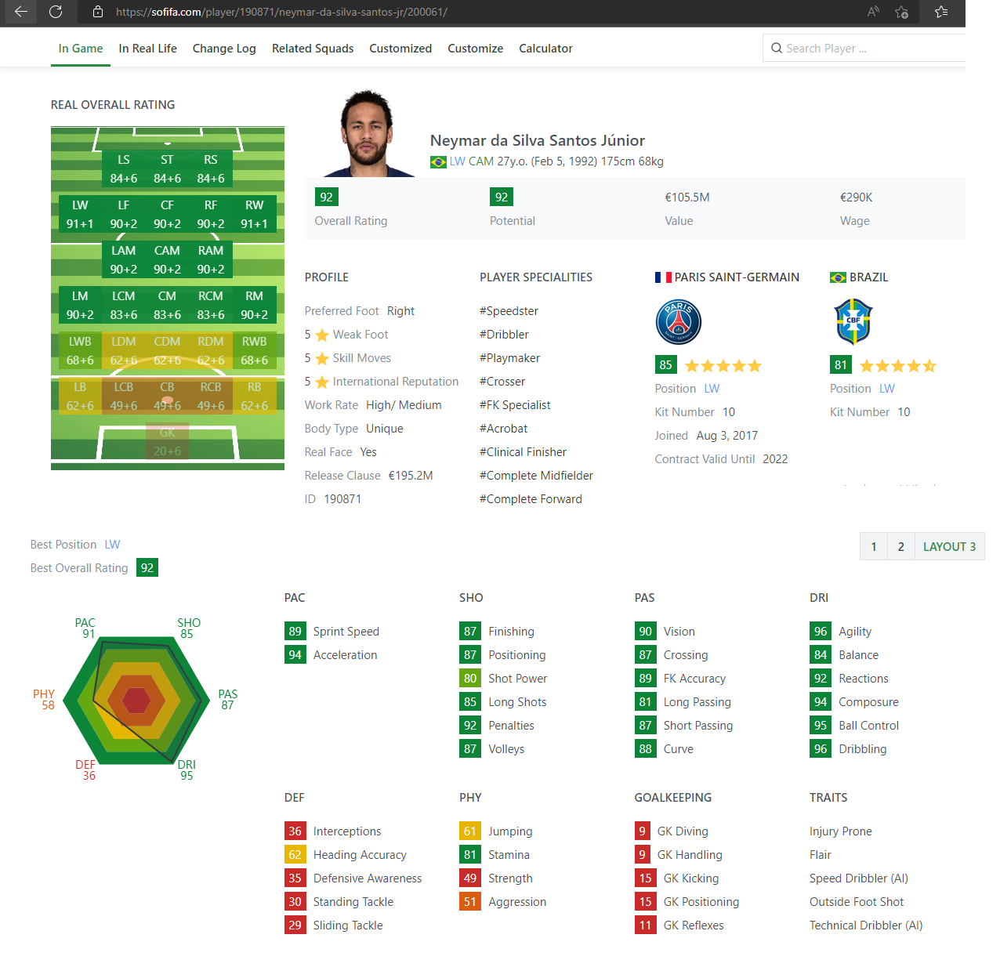

In [10]:
print(list(fifa20_dataset.columns[31:43]))
print("\nTotal columns :",len(list(fifa20_dataset.columns[31:43])))

['pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic', 'gk_diving', 'gk_handling', 'gk_kicking', 'gk_reflexes', 'gk_speed', 'gk_positioning']

Total columns : 12


These 12 columns are calculated based on the respective skillsets of each player. This is found by looking into one of the player's profile in sofifa website.

### <span style="color:darkblue">Exploratory Data Analysis <a id="3"></a></span>

##### <span style="color:darkblue">Univariate Analysis <a id="3.1"></a></span>
###### [back](#home)

                                             |                                                                …


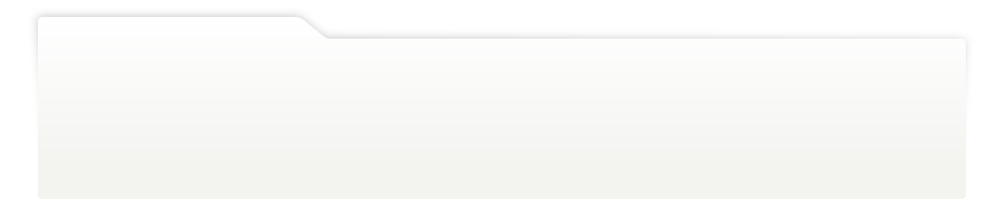
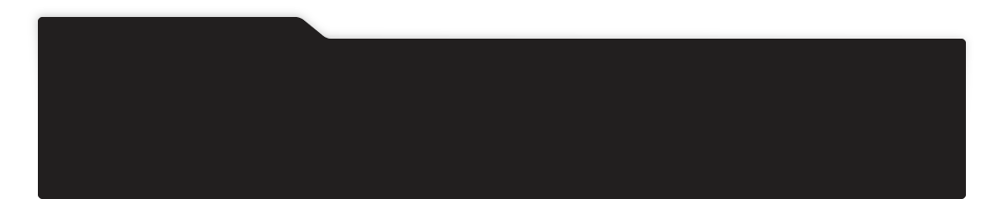
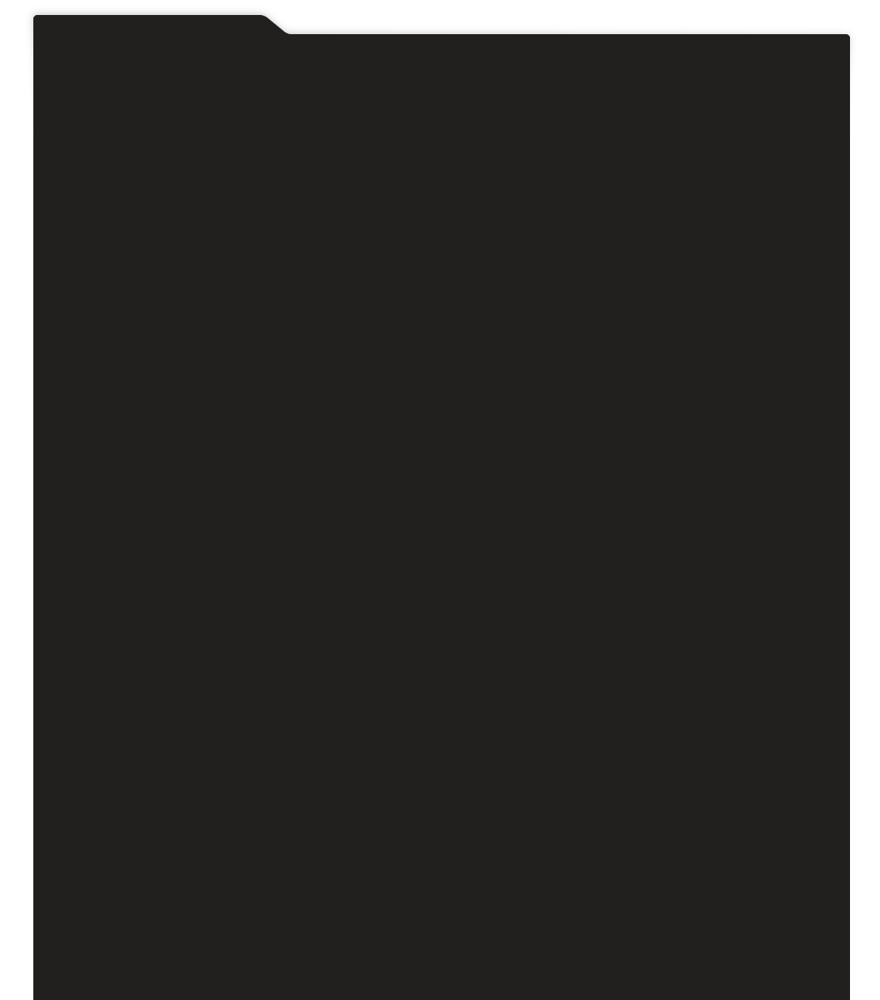
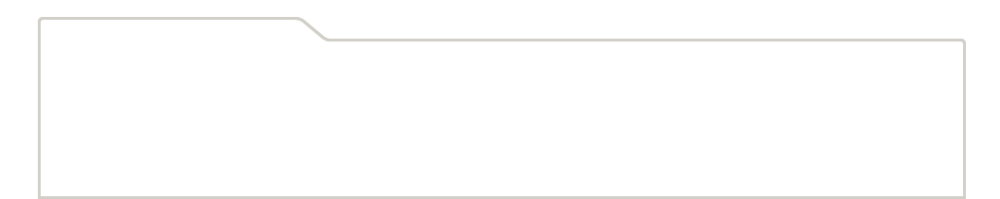
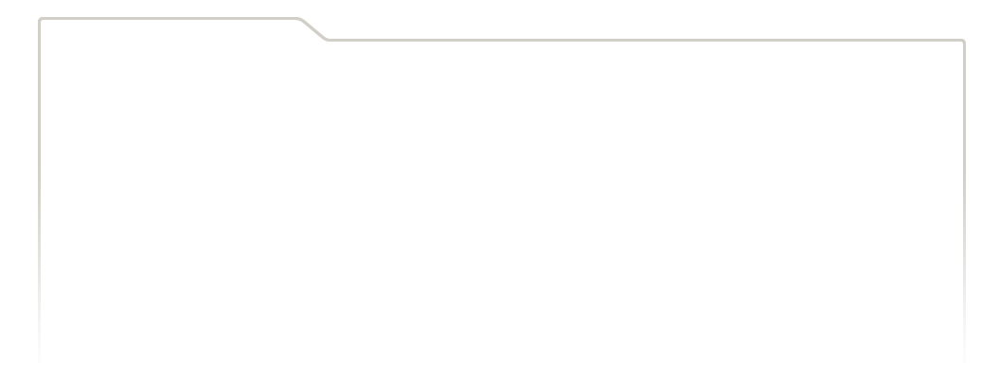
...
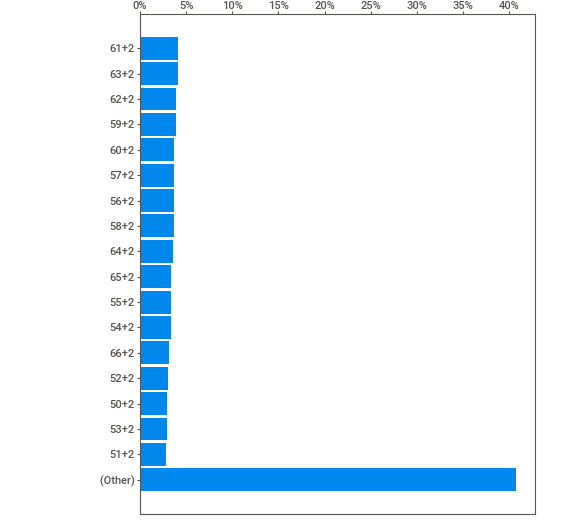
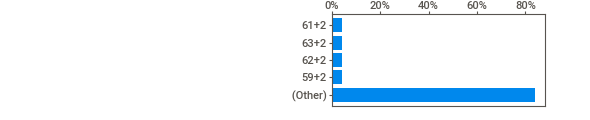
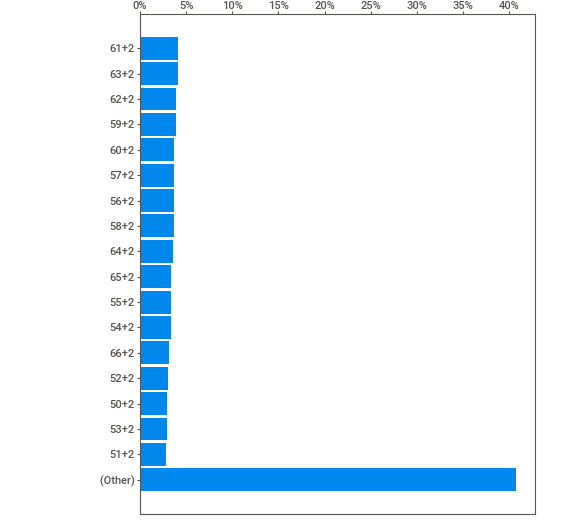
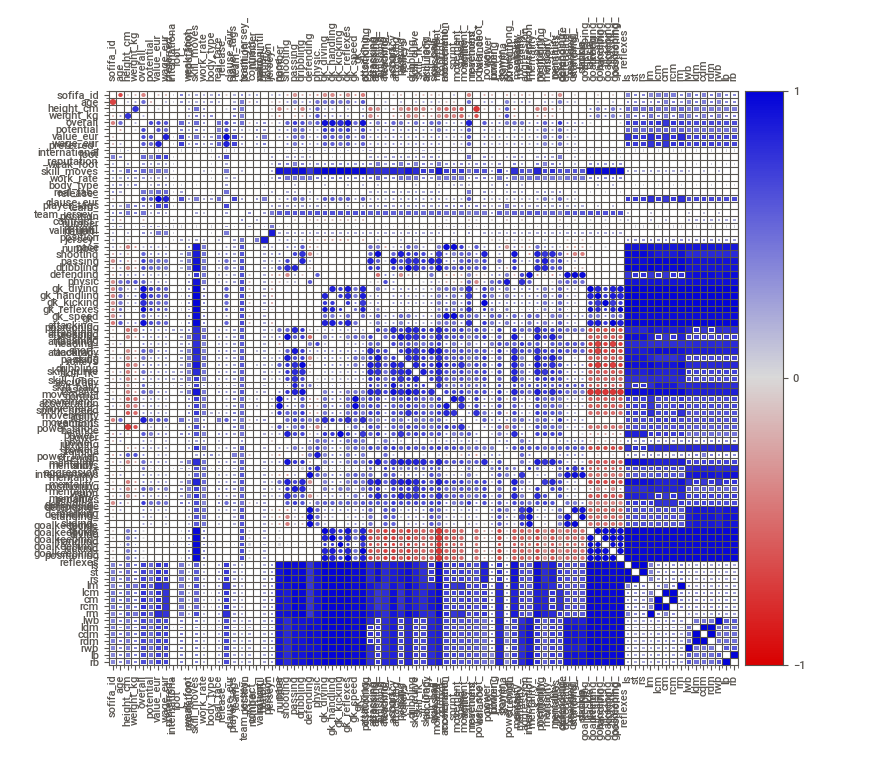
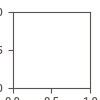

In [11]:
# Using Automated library for univariate analysis
import sweetviz as sv
my_report = sv.analyze(fifa20_dataset)
my_report.show_notebook()

Insights:

Numerical columns:
* Age: 
Players aged between 16 and 42.
Mean and Median is similar.
95% players aged lesser than 33 (ie. data is right skewed).
No missing values.
* height_cm column:
Players height between 156cm and 205cm.
Mean and Median is similar.
No missing values.
* weight_kg:
Players weights are between 50kg and 110kg.
50% of Player weights are between 70kg and 80kg.
Mean and Median is similar.
No missing values.
* overall:
overall ratings for players are between 48 and 94.
50% of overall ratings are between 62 and 71.
Only 5% of players have overall rating more than 78.
Mean and Median is similar.
No missing values.
* potential:
potential for the players are between 49 and 95.
50% of players potential are between 67 and 71.5.
Mean and Median is similar.
No missing values.
* value_euro:
values of players are between 0 and 105.5M.
50% players values are between 0.3M and 2.1M.
95% players values are less than 10.5M.(ie. data is right skewed).
No missing values.
* wage_eur:
wage of players are between 0k and 565k.
50% wage of players are between 1k and 8k.
95% wage of players are less than 38k (ie. data is right skewed).
No missing values.
* release_clause_eur:
Players release clause are between 0M and 195M.
95% players release clause are less than 20.4M.
50% release clause of players are between 0.6M and 3.7M.
7% of missing values in release clause column.
* pace:
pace of players are between 24 and 96.
Only 5% players pace are below 47(ie. data is left skewed).
50% players pace are between 61 and 75
11% missing values.Goal keeper data might be updated as null.
* shooting:
shooting rate of players are between 15 and 93.
Mean and Median is similar.
11% missing values.Goal keeper data might be updated as null.
* passing:
passing rate of players are between 24 and 92.
Mean and Median is similar.
95% players passing rate is less than 73.
11% missing values. Goal keeper data might be updated as null.
* dribbling:
dribbling rate of players are between 23 and 96.
95% players dribbling rate is less than 74.
11% missing values.Goal keeper data might be updated as null.
* defending:
defending rate of players are between 15 and 90.
95% players defending rate is less than 74.
11% missing values.Goal keeper data might be updated as null.
* physic:
physic rate of players are between 27 and 90.
5% players physic rate is less than 47. (ie. data is left skewed)
Mean and Median is similar.
95% players passing rate is less than 79.
11% missing values. Goal keeper data might be updated as null.
* gk_diving, gk_handling, gk_kicking, gk_reflexes,sk_speed,gk_positioning columns have 89% missing values. we have 11% Goal Keepers present in the dataset. Players who are not goal keepers may be updated as null.

Categorical Columns:
* Nationality:
No missing values.
9% nationality of players are from England.
* Preferred foot:
No missing values.
76% preferred foot is right
* weak_foot:
No missing values.
62% of players weak foot rating is 3.
* International Reputation:
No missing values.
92% players international reputation is 1 (which is low)
* skill_moves:
No missing values.
83% players are rated as 2 or 3.
* work_rate (attack/defence rate)
No missing values.
54% players are rated attack and defence as Medium/Medium.
* real face:
Only 11% players have real face in sofifa website.

### <span style="color:darkblue">Bivariate Analysis <a id="3.2"></a></span>
###### [back](#home)

In [12]:
%%html
<div class='tableauPlaceholder' id='viz1666831629316' style='position: relative'><noscript><a href='#'><img alt=' ' src='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;Bi&#47;BivariateAnalysis_Fifa20_dataset&#47;PotentialvsOverall&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='site_root' value='' /><param name='name' value='BivariateAnalysis_Fifa20_dataset&#47;PotentialvsOverall' /><param name='tabs' value='yes' /><param name='toolbar' value='yes' /><param name='static_image' value='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;Bi&#47;BivariateAnalysis_Fifa20_dataset&#47;PotentialvsOverall&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /><param name='language' value='en-US' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1666831629316');                    var vizElement = divElement.getElementsByTagName('object')[0];                    vizElement.style.width='100%';vizElement.style.height=(divElement.offsetWidth*0.75)+'px';                    var scriptElement = document.createElement('script');                    scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js';                    vizElement.parentNode.insertBefore(scriptElement, vizElement);                </script>

Insights:

Nationality vs International Reputation:
* Only few countries have players with high International reputation.

Potential vs Nationality: 
* Only few countries have players with potential greater than 90.
* International Reputation is not based on players potential. There are few players with high potential and low International Reputation.

Potential vs Overall:
* Overall is always lesser than or equal to players potentials.
* Potential of the players doesnot rely much on Work rate(Attack and Defence).

Potential vs Values_Euro:
* Values_Euro increases when Potential increases.
* Values_Euro increases when Skill Moves increases.
* Values_Euro increases when Weak foot increases.
* Values_Euro increases when workrate(Attack) is high.
* Values_Euro is low when work(Defence) is high when compared to workrate(Attack) is high.

Potential vs Dribbling skills:
* Goal keepers have less dribbling skills when compared to players with other positions.

Skill moves vs Potential:
* Goal keepers have low skill moves when compared to players with other positions. But players potential is high. 

Goal keeping diving vs Sprint speed:
* Sprint Speed of Goal keepers are low when compared to players with other team positions.

Goal keeping diving vs players reactions:
* Reactions of players with Team position "RES" is low when compared to players with other team positions.

Goal keeping Handling vs Stamina:
* Goal keepers have less stamina when compared to players with other team positions. 

Age vs Weight:
* When Age of the players increase, weight also increases.
* When weight increases, player skill moves rating decreases.

Height vs Weight
* When Height of the players increase, weight also increases.

### <span style="color:darkblue">Multivariate Analysis <a id="3.3"></a></span>
###### [back](#home)

In [13]:
%%html
<div class='tableauPlaceholder' id='viz1666747836569' style='position: relative'><noscript><a href='#'><img alt=' ' src='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;Mu&#47;MultivariateAnalysis_Fifa20_dataset&#47;AgevsSkillsets&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='site_root' value='' /><param name='name' value='MultivariateAnalysis_Fifa20_dataset&#47;AgevsSkillsets' /><param name='tabs' value='yes' /><param name='toolbar' value='yes' /><param name='static_image' value='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;Mu&#47;MultivariateAnalysis_Fifa20_dataset&#47;AgevsSkillsets&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /><param name='language' value='en-US' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1666747836569');                    var vizElement = divElement.getElementsByTagName('object')[0];                    vizElement.style.width='100%';vizElement.style.height=(divElement.offsetWidth*0.75)+'px';                    var scriptElement = document.createElement('script');                    scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js';                    vizElement.parentNode.insertBefore(scriptElement, vizElement);                </script>

Insights:
1. Pace, Shooting, Passing, Dribbling, Defending and Physic columns. These columns have the players updated with rating who are not Goal keepers.
2. Only one Gk Diving column is considered as representative column for Goal keeper columns analysis as all the Gk columns are updated with only Goal keepers data in the dataset.

Age(16-42) vs Skillsets:
* players aged more than 35 and players aged 16 have less Pace (< 80) rating.
* players aged lesser than 19 and aged more than 38 have less Shooting (< 80) rating.
* players aged lesser than 19 and aged more than 38 have less Passing (< 80) rating.
* players aged lesser than 18 and aged more than 37 have less Dribbling (< 80) rating.
* players aged lesser than 19 and aged more than 36 have less Defending (< 80) rating.
* players aged lesser than 19 and aged more than 37 have less Physic (< 80) rating.
* players aged lesser than 20 and aged more than 38 have less Gk Diving (< 80) rating. 

Players aged between 19 and 36 have good skillsets.

Weight Kg(50 kg to 110 kg) vs Skillsets:
* players with weight more than 90 kg have less Pace (< 80) rating.
* players weight between 61 kg and 95 kg have good Shooting (> 80) rating.
* players weight between 59 kg and 85 kg have good Passing (> 80) rating.
* players weight between 59 kg and 92 kg have good Dribbling (> 80) rating.
* players weight between 62 kg and 100 kg have good Defending (> 80) rating.
* players weight less than 63kg have less physic rating than other players.
* players weight between 70 kg and 100 kg have good Gk diving (> 80) rating. 

Players weight between 63 kg and 85 kg have good skillsets.

Height cm(156 cm to 205 cm) vs Skillsets:
* players height between 157 cm and 194 cm have good Pace (> 80) rating.
* players height between 169 cm and 197 cm have good Shooting (> 80) rating.
* players height between 163 cm and 195 cm have good Passing (> 80) rating.
* players height between 163 cm and 192 cm have good Dribbling (> 80) rating.
* players height between 163 cm and 199 cm have good Defending (> 80) rating.
* players height between 168 cm and 197 cm have good Defending (> 80) rating.
* players height between 180 cm and 199 cm have good Gk diving (> 80) rating. 

Players height between 169 cm and 192 cm have good skillsets.

#### <span style="color:darkblue">Prepare a rank ordered list of top 10 countries with most players. Which countries are producing the most footballers that play at this level? <a id="4"></a></span>
###### [back](#home)

In [14]:
# Rank ordered list of top 10 countries with most players
dict1 = Counter(fifa20_dataset['nationality'])
dict2 = {key: val for key, val in sorted(dict1.items(), key = lambda x: x[1], reverse = True)}
df_values = zip(list(dict2.keys())[0:10],list(dict2.values())[0:10])
df = pd.DataFrame(df_values,columns = ['Countries','Total players'])
df

,Countries,Total players
0,England,1667
1,Germany,1216
2,Spain,1035
3,France,984
4,Argentina,886
5,Brazil,824
6,Italy,732
7,Colombia,591
8,Japan,453
9,Netherlands,416


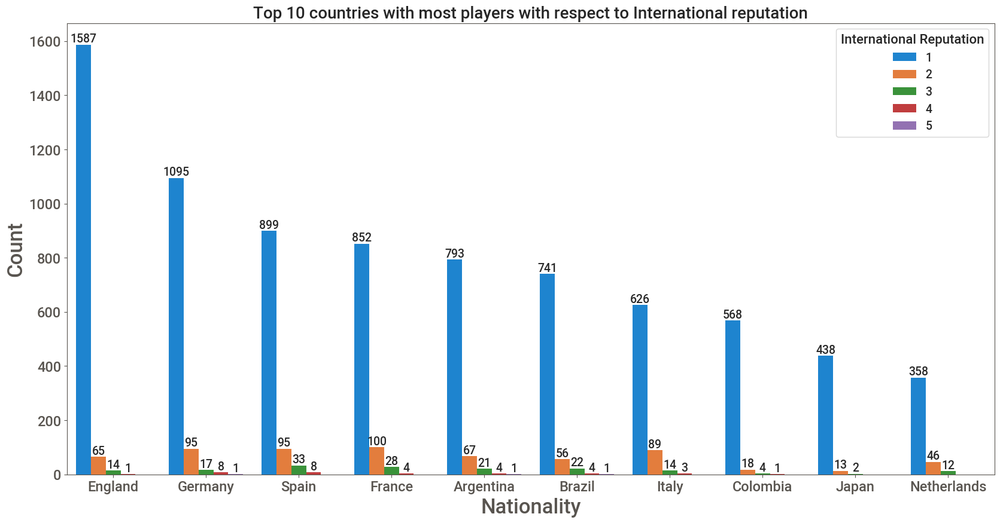

In [15]:
# Plotting Top 10 countries with most players with respect to International reputation
plt.figure(figsize= (20,10))
plot = sns.countplot(data = fifa20_dataset,
              x = 'nationality',
              hue = 'international_reputation',
              order = fifa20_dataset['nationality'].value_counts()[:10].index)
plot.set_xlabel("Nationality", fontsize = 25)
plot.set_ylabel("Count", fontsize = 25)
plt.xticks(fontsize = 17)
plt.yticks(fontsize = 17)
plot.set_title("Top 10 countries with most players with respect to International reputation", fontsize = 20)
plot.bar_label (plot.containers[0], fontsize =14)
plot.bar_label(plot.containers[1], fontsize =14)
plot.bar_label(plot.containers[2], fontsize =14)
plot.bar_label(plot.containers[3], fontsize =14)
plot.bar_label(plot.containers[4], fontsize =14)
plt.legend(loc="upper right", frameon=True, fontsize=14, title = "International Reputation",title_fontsize = "16")
plt.show()

#### <span style="color:darkblue">Plot the distribution of overall rating vs. age of players. Interpret what is the age after which a player stops improving?  <a id="5"></a></span>

###### [back](#home)

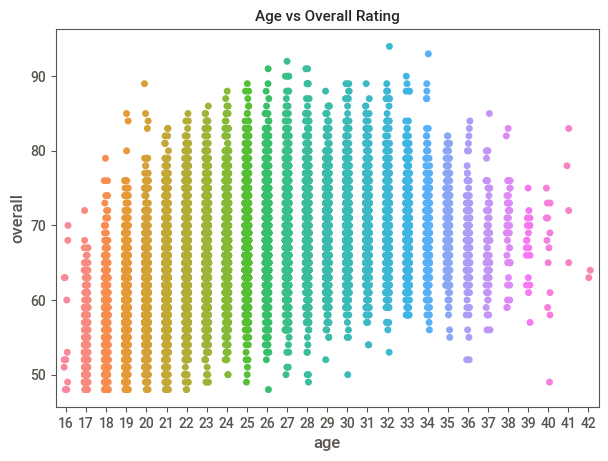

In [16]:
#Plotting the distribution of overall rating vs. age of players
plt.rcParams["figure.figsize"] =(7,5)
sns.stripplot(data=fifa20_dataset,x='age',y='overall').set_title("Age vs Overall Rating", fontsize = 11)
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)
plt.show()

Player overall ratings stops improving at age 27 

#### <span style="color:darkblue">Which type of offensive players tends to get paid the most: the striker, the right-winger, or the left-winger? <a id="6"></a></span>
###### [back](#home)

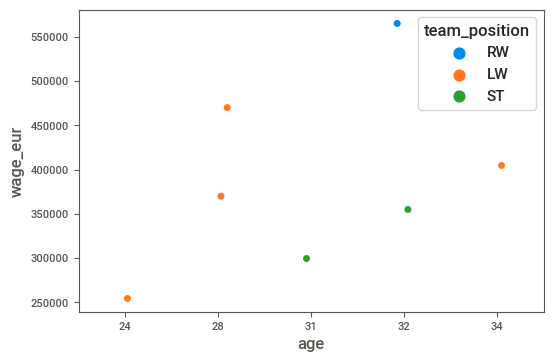

In [17]:
# Creating a new dataframe with striker, right-winger and left-winger players having wage more than 250000 Euro
team_position_filterred = fifa20_dataset[((fifa20_dataset['team_position'] == 'ST') | \
                          (fifa20_dataset['team_position'] == 'RW') | \
                          (fifa20_dataset['team_position'] == 'LW')) & (fifa20_dataset['wage_eur'] > 250000) ]
# Plotting players with respect to team position
plt.rcParams["figure.figsize"] =(6,4)
sns.stripplot(data=team_position_filterred,x='age',y='wage_eur',hue='team_position')
plt.show()

In [18]:
#players having wage more than 250000 Euro
team_position_filterred['team_position'].value_counts()

LW    4
ST    2
RW    1
Name: team_position, dtype: int64

Players with Left-Winger as their team positions tends to get paid the most.

### <span style="color:darkblue">Data Pre-processing and Feature Engineering <a id="7"></a></span>

#### <span style="color:darkblue">Handling Missing Values <a id="7.1"></a></span>
###### [back](#home)

In [19]:
# Creating list with the column names having missing values
missing_column_name = []
total_missing_values = []
for i in fifa20_dataset.columns:
    if (fifa20_dataset[i].count() < fifa20_dataset.shape[0]):
        missing_column_name.append(i)
        total_missing_values.append(fifa20_dataset.shape[0] - fifa20_dataset[i].count())
missing_values = zip(missing_column_name,total_missing_values)
missing_values_df = pd.DataFrame(missing_values,columns=['column_name','total_missing_values'])
missing_values_df['total_missing_percentage%'] = round(missing_values_df['total_missing_values']/fifa20_dataset.shape[0]*100,2)
missing_values_df

,column_name,total_missing_values,total_missing_percentage%
0,release_clause_eur,1298,7.10
1,player_tags,16779,91.80
2,team_position,240,1.31
3,team_jersey_number,240,1.31
4,loaned_from,17230,94.27
5,joined,1288,7.05
6,contract_valid_until,240,1.31
7,nation_position,17152,93.84
8,nation_jersey_number,17152,93.84
9,pace,2036,11.14


48 columns have missing values in the dataset

In [20]:
# Checking Total number of Goalkeepers present in the dataset
player_position_value_counts = dict(fifa20_dataset['player_positions'].value_counts())
print("Total no. of players who are Goal keepers in the dataset : ",player_position_value_counts.get("GK"))
print("Total no. of players who are not Goal keepers in the dataset : ",fifa20_dataset.shape[0] - player_position_value_counts.get("GK"))

Total no. of players who are Goal keepers in the dataset :  2036
Total no. of players who are not Goal keepers in the dataset :  16242


In [21]:
# Checking columns calculated based on player skillsets with respect to Goal keepers and Non Goal keepers
goal_keeper = missing_column_name[15:21]
print("{} columns updated only for Goal Keepers : \n {}".format(len(goal_keeper),goal_keeper))
non_goal_keeper = missing_column_name[9:15]
print("\n{} columns updated only for Non Goal Keepers : \n {}".format(len(non_goal_keeper),non_goal_keeper))

6 columns updated only for Goal Keepers : 
 ['gk_diving', 'gk_handling', 'gk_kicking', 'gk_reflexes', 'gk_speed', 'gk_positioning']

6 columns updated only for Non Goal Keepers : 
 ['pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic']


No actions required for the missing values present in the above listed columns. These columns will be removed.

Below new columns will be created in dataset by combining Goal Keepers and Non Goal Keepers columns.

'PAC / DIV'(pace+gk_diving),'SHO / HAN'(shooting+gk_handling),'PAS / KIC'(passing/gk_kicking),'DRI / REF'(dribbling+gk_reflexing),'DEF / SPD'(defending+gk_speed), 'PHY / POS'(physic+gk_positioning). New column names based on the filters provided in the sofifa website(https://sofifa.com/players)

In [22]:
# Creating new columns 'PAC / DIV'(pace+gk_diving),'SHO / HAN'(shooting+gk_handling),'PAS / KIC'(passing/gk_kicking),
#'DRI / REF'(dribbling+gk_reflexing),'DEF / SPD'(defending+gk_speed), 'PHY / POS'(physic+gk_positioning)

# Copying Non Goal keepers values and creating new columns
fifa20_dataset['PAC / DIV'] = fifa20_dataset['pace'].copy()
fifa20_dataset['SHO / HAN'] = fifa20_dataset['shooting'].copy()
fifa20_dataset['PAS / KIC'] = fifa20_dataset['passing'].copy()
fifa20_dataset['DRI / REF'] = fifa20_dataset['dribbling'].copy()
fifa20_dataset['DEF / SPD'] = fifa20_dataset['defending'].copy()
fifa20_dataset['PHY / POS'] = fifa20_dataset['physic'].copy()

In [23]:
# Updating the Goal keeper values to newly created columns
new_columns = ['PAC / DIV','SHO / HAN','PAS / KIC','DRI / REF','DEF / SPD','PHY / POS']
gk_columns = ['gk_diving','gk_handling','gk_kicking','gk_reflexes','gk_speed','gk_positioning']
list1= list(fifa20_dataset[fifa20_dataset['PAC / DIV'].isnull() == True].index)
for cols,gk_cols in zip(new_columns,gk_columns):
  for i in list1:
      fifa20_dataset.at[i,cols]=fifa20_dataset.iloc[i][gk_cols]

In [24]:
#Checking whether newly created columns have missing values
for i in new_columns:
  print("Total no. of missing values in {} : {}".format(i,fifa20_dataset[i].isnull().sum()))

Total no. of missing values in PAC / DIV : 0
Total no. of missing values in SHO / HAN : 0
Total no. of missing values in PAS / KIC : 0
Total no. of missing values in DRI / REF : 0
Total no. of missing values in DEF / SPD : 0
Total no. of missing values in PHY / POS : 0


In [25]:
# position related columns
position_related_columns = missing_column_name[22:]
print(position_related_columns)

['ls', 'st', 'rs', 'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram', 'lm', 'lcm', 'cm', 'rcm', 'rm', 'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb']


These 26 columns are calculated based on skillsets (column Index 44-77) of each player. This is found by using calculator in sofifa website (https://sofifa.com/calculator). So these columns can be considered as unwanted columns as well

In [26]:
# Displaying details of remaining columns in missing_values_df dataframe
remaining_missing_df = missing_values_df.iloc[0:9].append(missing_values_df[21:22])
remaining_missing_df.sort_values(by='total_missing_percentage%', ascending=False)

,column_name,total_missing_values,total_missing_percentage%
4,loaned_from,17230,94.27
7,nation_position,17152,93.84
8,nation_jersey_number,17152,93.84
1,player_tags,16779,91.80
21,player_traits,10712,58.61
0,release_clause_eur,1298,7.10
5,joined,1288,7.05
2,team_position,240,1.31
3,team_jersey_number,240,1.31
6,contract_valid_until,240,1.31


* loaned_from, nation_position, nation_jersey_number,player_tags - These 4 columns are having missing values with more than 90%. Hence, no actions required on these columns. These columns will also be ignored while clustering.
* player_traits column has 58.61% missing data, hence this column can be ignored while clustering.
* joined, contract_valid_until and team_jersey_number,release_clause_eur are not relevant to skillsets of the players will not be considered for clustering. so no actions required on these columns.
*  team_position - team_position will be based on the player skillsets, so this feature can be ignored for clustering.

Above 10 missing value columns are not considered for clustering

#### <span style="color:darkblue">Removing the unwanted features <a id="7.2"></a></span>
###### [back](#home)

In [27]:
# Creating column lists from the dataset, which are required for clustering
clustering_columns = list(fifa20_dataset.columns)
#Removing 48 column names which have missing values as they are not required for clustering, 
#we have created 'PAC / DIV','SHO / HAN', 'PAS / KIC', 'DRI / REF', 'DEF / SPD', 'PHY / POS' columns based on player attribute columns which have missing values 
for i in missing_column_name:
    clustering_columns.remove(i)
print(clustering_columns)
print("\n Total columns :", len(clustering_columns))

['sofifa_id', 'player_url', 'short_name', 'long_name', 'age', 'dob', 'height_cm', 'weight_kg', 'nationality', 'club', 'overall', 'potential', 'value_eur', 'wage_eur', 'player_positions', 'preferred_foot', 'international_reputation', 'weak_foot', 'skill_moves', 'work_rate', 'body_type', 'real_face', 'attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy', 'attacking_short_passing', 'attacking_volleys', 'skill_dribbling', 'skill_curve', 'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed', 'movement_agility', 'movement_reactions', 'movement_balance', 'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots', 'mentality_aggression', 'mentality_interceptions', 'mentality_positioning', 'mentality_vision', 'mentality_penalties', 'mentality_composure', 'defending_marking', 'defending_standing_tackle', 'defending_sliding_tackle', 'goalkeeping_diving', 'goalkeeping_handling', 'goalkee


* Below columns are considered as unwanted columns as it is not relevant to skillsets or other player attributes.

 ['sofifa_id','age','weight_kg','height_cm', 'player_url', 'short_name', 'long_name', 'dob','nationality', 'club','value_eur', 'wage_eur', 'player_positions','international_reputation', 'body_type', 'real_face']

* Overall and Potential attribute is used only in analysis and discussion stages because using it in modelling could lead to domination by this feature.


In [28]:
# Creating list of unwanted columns, which dont have missing values as these columns doesnt belong to player attributes
unwanted_columns = ['sofifa_id', 'player_url', 'short_name', 'long_name', 'dob','nationality', 'club','value_eur', 'wage_eur', \
                    'age','weight_kg','height_cm','player_positions', 'body_type', 'real_face','overall','potential','international_reputation']
print("Total number of unwanted columns :", len(unwanted_columns))
for i in unwanted_columns:
    clustering_columns.remove(i)
print("\n List of columns to be considered for clustering:")
print(clustering_columns)
print("\n Total columns to be considered for clustering:", len(clustering_columns))

Total number of unwanted columns : 18

 List of columns to be considered for clustering:
['preferred_foot', 'weak_foot', 'skill_moves', 'work_rate', 'attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy', 'attacking_short_passing', 'attacking_volleys', 'skill_dribbling', 'skill_curve', 'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed', 'movement_agility', 'movement_reactions', 'movement_balance', 'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots', 'mentality_aggression', 'mentality_interceptions', 'mentality_positioning', 'mentality_vision', 'mentality_penalties', 'mentality_composure', 'defending_marking', 'defending_standing_tackle', 'defending_sliding_tackle', 'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking', 'goalkeeping_positioning', 'goalkeeping_reflexes', 'PAC / DIV', 'SHO / HAN', 'PAS / KIC', 'DRI / REF', 'DEF / SPD', 'PHY / POS']

 Total

In [29]:
# Creating a dataframe which have columns to be considered for clustering
fifa20_cluster_df = fifa20_dataset[clustering_columns]

In [30]:
fifa20_cluster_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Data columns (total 44 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   preferred_foot              18278 non-null  object 
 1   weak_foot                   18278 non-null  int64  
 2   skill_moves                 18278 non-null  int64  
 3   work_rate                   18278 non-null  object 
 4   attacking_crossing          18278 non-null  int64  
 5   attacking_finishing         18278 non-null  int64  
 6   attacking_heading_accuracy  18278 non-null  int64  
 7   attacking_short_passing     18278 non-null  int64  
 8   attacking_volleys           18278 non-null  int64  
 9   skill_dribbling             18278 non-null  int64  
 10  skill_curve                 18278 non-null  int64  
 11  skill_fk_accuracy           18278 non-null  int64  
 12  skill_long_passing          18278 non-null  int64  
 13  skill_ball_control          182

#### <span style="color:darkblue">Handling features having multiple values <a id="7.3"></a></span>
###### [back](#home)

In [31]:
fifa20_cluster_df['work_rate'].value_counts()

Medium/Medium    9875
High/Medium      3216
Medium/High      1718
High/High         986
Medium/Low        886
High/Low          684
Low/Medium        461
Low/High          417
Low/Low            35
Name: work_rate, dtype: int64

Players have multiple values in work_rate column which are seperated by /. ie. Attack rate/Defense rate

In [32]:
# Splitting player_positions and workrate columns based on seperator and create new columns in fifa20_cluster_df
fifa20_cluster_df[['attack_rate','defence_rate']] = fifa20_cluster_df['work_rate'].str.split("/",expand=True)
fifa20_cluster_df.drop(["work_rate"],axis="columns", inplace=True)

In [33]:
fifa20_cluster_df['attack_rate'].value_counts()

Medium    12479
High       4886
Low         913
Name: attack_rate, dtype: int64

In [34]:
fifa20_cluster_df['defence_rate'].value_counts()

Medium    13552
High       3121
Low        1605
Name: defence_rate, dtype: int64

#### <span style="color:darkblue">Handling duplicates <a id="7.4"></a></span>
###### [back](#home)

In [35]:
# Checking whether the dataset contains duplicate rows
fifa20_cluster_df.duplicated().sum()

0

There are no duplicates present in the dataset

#### <span style="color:darkblue">Handling Categorical Features <a id="7.5"></a></span>
###### [back](#home)

In [36]:
fifa20_cluster_df.columns

Index(['preferred_foot', 'weak_foot', 'skill_moves', 'attacking_crossing',
       'attacking_finishing', 'attacking_heading_accuracy',
       'attacking_short_passing', 'attacking_volleys', 'skill_dribbling',
       'skill_curve', 'skill_fk_accuracy', 'skill_long_passing',
       'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed',
       'movement_agility', 'movement_reactions', 'movement_balance',
       'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength',
       'power_long_shots', 'mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision', 'mentality_penalties',
       'mentality_composure', 'defending_marking', 'defending_standing_tackle',
       'defending_sliding_tackle', 'goalkeeping_diving',
       'goalkeeping_handling', 'goalkeeping_kicking',
       'goalkeeping_positioning', 'goalkeeping_reflexes', 'PAC / DIV',
       'SHO / HAN', 'PAS / KIC', 'DRI / REF', 'DEF / SPD', 'PHY / POS',
       'atta

In [37]:
 # Encoding the categorical features using One Hot encoding technique
fifa20_cluster_df = pd.get_dummies(fifa20_cluster_df,columns = ['attack_rate','defence_rate','preferred_foot'], drop_first=True)

In [38]:
fifa20_cluster_df.columns

Index(['weak_foot', 'skill_moves', 'attacking_crossing', 'attacking_finishing',
       'attacking_heading_accuracy', 'attacking_short_passing',
       'attacking_volleys', 'skill_dribbling', 'skill_curve',
       'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control',
       'movement_acceleration', 'movement_sprint_speed', 'movement_agility',
       'movement_reactions', 'movement_balance', 'power_shot_power',
       'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots',
       'mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision', 'mentality_penalties',
       'mentality_composure', 'defending_marking', 'defending_standing_tackle',
       'defending_sliding_tackle', 'goalkeeping_diving',
       'goalkeeping_handling', 'goalkeeping_kicking',
       'goalkeeping_positioning', 'goalkeeping_reflexes', 'PAC / DIV',
       'SHO / HAN', 'PAS / KIC', 'DRI / REF', 'DEF / SPD', 'PHY / POS',
       'attack_rate_Low', 'att

#### <span style="color:darkblue">Handling Outliers <a id="7.6"></a></span>
###### [back](#home)

In [39]:
# Creating list for categorical and numerical columns
categorical = ['weak_foot','skill_moves','attack_rate_Low', 'attack_rate_Medium','defence_rate_Low', 'defence_rate_Medium', 'preferred_foot_Right']
numerical = list(fifa20_cluster_df.columns)
for i in categorical:
  numerical.remove(i)

print("Total number of categorical columns:",len(categorical))
print("Total number of numerical columns:",len(numerical))

Total number of categorical columns: 7
Total number of numerical columns: 40


In [40]:
# Outlier detection using IQR method also check skewness and kurtosis of the numerical columns
from scipy.stats import skew,kurtosis
def check_outliers_skewness_kurtosis(columns):
 Q1_df = []
 Q3_df = []
 IQR_df = []
 lower_limit_df = []
 upper_limit_df = []
 lower_total_rows = []
 upper_total_rows =  []
 skewness = []
 kurtosis_ = []
 for cols in columns:
     Q1 = fifa20_cluster_df[cols].quantile(0.25)
     Q1_df.append(Q1)
     Q3 = fifa20_cluster_df[cols].quantile(0.75)
     Q3_df.append(Q3)
     IQR = Q3 - Q1
     IQR_df.append(IQR)
     lower_limit = Q1 - 1.5 * IQR
     lower_limit_df.append(lower_limit)
     upper_limit = Q3 + 1.5 * IQR
     upper_limit_df.append(upper_limit)
     below_lowerlimit_total_rows = (fifa20_cluster_df[cols] < lower_limit).sum()
     lower_total_rows.append(below_lowerlimit_total_rows)
     above_upperlimit_total_rows = (fifa20_cluster_df[cols] > upper_limit).sum()
     upper_total_rows.append(above_upperlimit_total_rows)
     skewness.append(skew(fifa20_cluster_df[cols], axis=0, bias=True))
     kurtosis_.append(kurtosis(fifa20_cluster_df[cols], axis=0, bias=True))
 return Q1_df,Q3_df,IQR_df,lower_limit_df,lower_total_rows,upper_limit_df,upper_total_rows,skewness,kurtosis_

Q1_df,Q3_df,IQR_df,lower_limit_df,lower_total_rows,upper_limit_df,upper_total_rows,skewness,kurtosis_ = check_outliers_skewness_kurtosis(numerical)
df_list = list(zip(Q1_df,Q3_df,IQR_df,lower_limit_df,lower_total_rows,upper_limit_df,upper_total_rows,skewness,kurtosis_))
df_outliers = pd.DataFrame(df_list,columns=['Q1','Q3','IQR','lower_limit','lower_limit_total_rows','upper_limit',\
                                            'upper_limit_total_rows','skewness','kurtosis'], index = numerical)
df_outliers

,Q1,Q3,IQR,lower_limit,lower_limit_total_rows,upper_limit,upper_limit_total_rows,skewness,kurtosis
attacking_crossing,38.0,64.0,26.0,-1.0,0,103.0,0,-0.604794,-0.520677
attacking_finishing,30.0,62.0,32.0,-18.0,0,110.0,0,-0.316910,-0.944113
attacking_heading_accuracy,44.0,64.0,20.0,14.0,1068,94.0,0,-0.880861,0.284942
attacking_short_passing,54.0,68.0,14.0,33.0,1723,89.0,11,-1.136120,0.896382
attacking_volleys,30.0,56.0,26.0,-9.0,0,95.0,0,-0.156454,-0.681253
skill_dribbling,50.0,68.0,18.0,23.0,2033,95.0,2,-1.117501,0.418339
skill_curve,34.0,62.0,28.0,-8.0,0,104.0,0,-0.263078,-0.726198
skill_fk_accuracy,31.0,56.0,25.0,-6.5,0,93.5,1,0.094109,-0.703019
skill_long_passing,43.0,64.0,21.0,11.5,13,95.5,0,-0.590322,-0.354716
skill_ball_control,54.0,69.0,15.0,31.5,2040,91.5,11,-1.290189,1.080917


In [41]:
df_outliers[(df_outliers['skewness'] >= -0.5) & (df_outliers['skewness'] <= 0.5)].shape[0]

22

22 columns out of 40 columns are nearly symmetrical

In [42]:
# Checking positively skewed and negatively skewed columns
positively_skewed= df_outliers[(df_outliers['skewness'] > 0.5)].index
negatively_skewed = df_outliers[(df_outliers['skewness'] < -0.5)].index
print(positively_skewed,"\n\n",negatively_skewed)

Index(['goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking',
       'goalkeeping_positioning', 'goalkeeping_reflexes'],
      dtype='object') 

 Index(['attacking_crossing', 'attacking_heading_accuracy',
       'attacking_short_passing', 'skill_dribbling', 'skill_long_passing',
       'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed',
       'movement_agility', 'movement_balance', 'power_stamina',
       'mentality_positioning', 'DRI / REF'],
      dtype='object')


In [43]:
# Performing log transformation for positively skewed columns
for cols in positively_skewed:
  fifa20_cluster_df[cols] = np.log(fifa20_dataset[cols])

# Performing Squares transformation for negatively skewed columns
for cols in negatively_skewed:
  fifa20_cluster_df[cols] = np.square(fifa20_dataset[cols])

In [44]:
# Checking skewness for the updated columns
updated_columns = list(positively_skewed) + list(negatively_skewed)
Q1_df,Q3_df,IQR_df,lower_limit_df,lower_total_rows,upper_limit_df,upper_total_rows,skewness,kurtosis_ = check_outliers_skewness_kurtosis(updated_columns)
df_list = list(zip(Q1_df,Q3_df,IQR_df,lower_limit_df,lower_total_rows,upper_limit_df,upper_total_rows,skewness,kurtosis_))
df_outliers = pd.DataFrame(df_list,columns=['Q1','Q3','IQR','lower_limit','lower_limit_total_rows','upper_limit',\
                                            'upper_limit_total_rows','skewness','kurtosis'], index = updated_columns)
df_outliers

,Q1,Q3,IQR,lower_limit,lower_limit_total_rows,upper_limit,upper_limit_total_rows,skewness,kurtosis
goalkeeping_diving,2.079442,2.639057,0.559616,1.240018,33,3.478481,2040,1.502090,1.981448
goalkeeping_handling,2.079442,2.639057,0.559616,1.240018,37,3.478481,2041,1.472825,1.945562
goalkeeping_kicking,2.079442,2.639057,0.559616,1.240018,37,3.478481,2043,1.449606,1.914706
goalkeeping_positioning,2.079442,2.639057,0.559616,1.240018,31,3.478481,2040,1.487908,1.987619
goalkeeping_reflexes,2.079442,2.639057,0.559616,1.240018,36,3.478481,2042,1.513649,2.015907
attacking_crossing,1444.000000,4096.000000,2652.000000,-2534.000000,0,8074.000000,6,0.071001,-0.784909
attacking_heading_accuracy,1936.000000,4096.000000,2160.000000,-1304.000000,0,7336.000000,42,-0.015237,-0.410753
attacking_short_passing,2916.000000,4624.000000,1708.000000,354.000000,251,7186.000000,79,-0.445997,-0.107654
skill_dribbling,2500.000000,4624.000000,2124.000000,-686.000000,0,7810.000000,31,-0.374657,-0.452902
skill_long_passing,1849.000000,4096.000000,2247.000000,-1521.500000,0,7466.500000,18,0.012040,-0.617748


In [45]:
# Checking highly positively skewed and negatively skewed columns
highly_positively_skewed= df_outliers[(df_outliers['skewness'] > 1)].index
highly_negatively_skewed = df_outliers[(df_outliers['skewness'] < -1)].index
print(highly_positively_skewed,"\n\n",highly_negatively_skewed)

Index(['goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking',
       'goalkeeping_positioning', 'goalkeeping_reflexes'],
      dtype='object') 

 Index([], dtype='object')


In [46]:
df_outliers[df_outliers['skewness'] > 1]

,Q1,Q3,IQR,lower_limit,lower_limit_total_rows,upper_limit,upper_limit_total_rows,skewness,kurtosis
goalkeeping_diving,2.079442,2.639057,0.559616,1.240018,33,3.478481,2040,1.502090,1.981448
goalkeeping_handling,2.079442,2.639057,0.559616,1.240018,37,3.478481,2041,1.472825,1.945562
goalkeeping_kicking,2.079442,2.639057,0.559616,1.240018,37,3.478481,2043,1.449606,1.914706
goalkeeping_positioning,2.079442,2.639057,0.559616,1.240018,31,3.478481,2040,1.487908,1.987619
goalkeeping_reflexes,2.079442,2.639057,0.559616,1.240018,36,3.478481,2042,1.513649,2.015907


Skewness of the above columns are however reduced. So we will proceed with next step

In [47]:
print(fifa20_cluster_df.columns)

Index(['weak_foot', 'skill_moves', 'attacking_crossing', 'attacking_finishing',
       'attacking_heading_accuracy', 'attacking_short_passing',
       'attacking_volleys', 'skill_dribbling', 'skill_curve',
       'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control',
       'movement_acceleration', 'movement_sprint_speed', 'movement_agility',
       'movement_reactions', 'movement_balance', 'power_shot_power',
       'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots',
       'mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision', 'mentality_penalties',
       'mentality_composure', 'defending_marking', 'defending_standing_tackle',
       'defending_sliding_tackle', 'goalkeeping_diving',
       'goalkeeping_handling', 'goalkeeping_kicking',
       'goalkeeping_positioning', 'goalkeeping_reflexes', 'PAC / DIV',
       'SHO / HAN', 'PAS / KIC', 'DRI / REF', 'DEF / SPD', 'PHY / POS',
       'attack_rate_Low', 'att

#### <span style="color:darkblue">Feature selection using correlation <a id="7.7"></a></span>
###### [back](#home)

In [48]:
# As there are too many columns, checking the correlation by creating a new dataframe with values of correlation and checking highly correlated features
def create_corr_lists():
  df = fifa20_cluster_df.corr()
  feature_1 = []
  feature_2 = []
  correlation = []
  for i,j in zip(range(0,len(df.index)),df.index):
    for k in df.columns:
      feature_1.append(j)
      feature_2.append(k)
      correlation.append(df.iloc[i][k])
  return feature_1,feature_2,correlation
  
feature_1,feature_2,correlation =  create_corr_lists()
correlation_df = pd.DataFrame(zip(feature_1,feature_2,correlation), columns= ['feature_1','feature_2','correlation'])
correlation_df_filtered = (correlation_df[(correlation_df['correlation'] > 0.9 ) & (correlation_df['correlation'] < 1 )]).sort_values(by = 'correlation',ascending = False).reset_index()
correlation_df_filtered

,index,feature_1,feature_2,correlation
0,1439,defending_sliding_tackle,defending_standing_tackle,0.975808
1,1393,defending_standing_tackle,defending_sliding_tackle,0.975808
2,1110,mentality_interceptions,defending_standing_tackle,0.945287
3,1386,defending_standing_tackle,mentality_interceptions,0.945287
4,1433,defending_sliding_tackle,mentality_interceptions,0.933894
5,1111,mentality_interceptions,defending_sliding_tackle,0.933894
6,340,skill_dribbling,skill_ball_control,0.930485
7,524,skill_ball_control,skill_dribbling,0.930485
8,623,movement_sprint_speed,movement_acceleration,0.919626
9,577,movement_acceleration,movement_sprint_speed,0.919626


<AxesSubplot:>

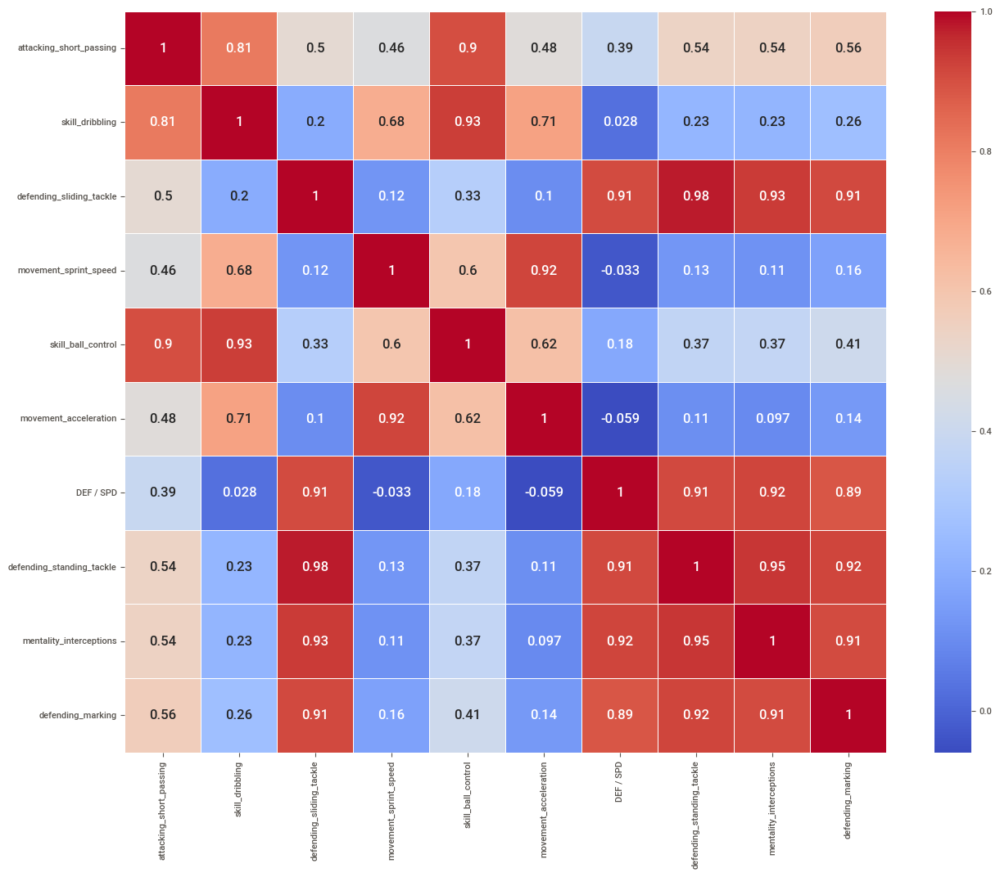

In [49]:
# Checking correlation only with the highly correlated features
plt.rcParams["figure.figsize"] = (15,12)
sns.heatmap(fifa20_cluster_df[set(correlation_df_filtered['feature_1'])].corr(),annot=True, linewidths= .6,cmap="coolwarm")

In [50]:
# Dropping few columns from highly correlated columns
columns_to_drop= ['movement_acceleration','skill_ball_control', 'defending_sliding_tackle', \
                  'mentality_interceptions','defending_standing_tackle']
fifa20_cluster_df.drop(columns_to_drop,axis=1,inplace=True)
fifa20_cluster_df.shape

(18278, 42)

In [51]:
# Creating correlation dataframe and checking highly correlated features
feature_1,feature_2,correlation =  create_corr_lists()
correlation_df = pd.DataFrame(zip(feature_1,feature_2,correlation), columns= ['feature_1','feature_2','correlation'])
correlation_df_filtered = (correlation_df[(correlation_df['correlation'] > 0.9 ) & (correlation_df['correlation'] < 1 )]).sort_values(by = 'correlation',ascending = False).reset_index()
print(correlation_df_filtered)

Empty DataFrame
Columns: [index, feature_1, feature_2, correlation]
Index: []


Now there is no highly correlated features > 0.9 correlation

#### <span style="color:darkblue">Scaling the data <a id="7.8"></a></span>
###### [back](#home)

In [52]:
# Updating numerical columns
for i in columns_to_drop:
  numerical.remove(i)

In [53]:
print(numerical)

['attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy', 'attacking_short_passing', 'attacking_volleys', 'skill_dribbling', 'skill_curve', 'skill_fk_accuracy', 'skill_long_passing', 'movement_sprint_speed', 'movement_agility', 'movement_reactions', 'movement_balance', 'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots', 'mentality_aggression', 'mentality_positioning', 'mentality_vision', 'mentality_penalties', 'mentality_composure', 'defending_marking', 'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking', 'goalkeeping_positioning', 'goalkeeping_reflexes', 'PAC / DIV', 'SHO / HAN', 'PAS / KIC', 'DRI / REF', 'DEF / SPD', 'PHY / POS']


In [54]:
# Scaling the numerical continuos features
scaler = StandardScaler()
fifa20_cluster_df[numerical] = scaler.fit_transform(fifa20_cluster_df[numerical])

In [55]:
fifa20_cluster_df[numerical].head()

,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,PAC / DIV,SHO / HAN,PAS / KIC,DRI / REF,DEF / SPD,PHY / POS
0,2.978322,2.521670,1.170522,3.187676,2.552950,3.409797,2.479269,2.942162,3.642438,1.533613,2.493528,3.639424,2.767206,2.087565,0.257408,0.777987,0.220611,2.442165,-0.447066,3.453020,2.894270,1.694500,3.154006,-0.689317,-1.077964,-0.168139,0.314039,0.203106,-0.649459,1.780558,2.775270,3.348831,4.199877,-0.669656,0.133966
1,2.563214,2.470634,3.062336,2.141107,2.496457,2.558454,1.827892,1.909646,1.947272,2.233002,1.881041,3.748889,0.444137,2.762951,2.519902,1.658714,1.018411,2.390410,0.419101,3.562799,2.034379,2.331132,3.069835,-0.938188,-0.845749,-0.168139,0.314039,0.203106,-0.171558,2.053748,2.847368,2.371183,3.143584,-0.912696,1.379559
2,2.872735,2.113383,0.509233,2.592959,2.496457,3.299374,2.207862,2.540628,2.369893,2.027467,2.815083,3.311030,1.619083,1.637308,-0.329165,1.293212,-1.295210,1.924615,-0.273833,2.717096,2.607640,2.649447,2.985664,-0.987962,-0.467166,-0.475937,0.314039,0.308794,-0.171558,2.144812,2.270588,2.860007,4.044084,-1.094976,-0.696429
3,-1.592083,-1.765341,-1.757060,-1.207912,-1.684020,-1.891070,-1.863250,-1.646800,-0.947549,-0.439520,0.134321,2.873171,-1.095247,0.061408,1.095369,-1.393008,1.018411,-1.801743,-1.255488,-1.609000,0.816199,-2.379943,0.797206,-0.987962,2.950409,3.089582,2.862588,3.053520,2.966005,1.780558,2.775270,1.980124,3.143584,0.120223,2.625151
4,2.264554,1.960276,0.432208,2.826859,2.270485,3.190096,1.936455,2.081732,2.589228,1.926413,2.706764,3.092100,2.657000,1.787394,-0.748145,1.565688,-0.178289,1.717595,-0.100599,2.717096,2.535982,2.522121,2.733149,-0.639543,-0.164873,-0.034677,-1.102392,-0.654147,-0.649459,2.144812,2.126393,2.762242,3.889922,-0.912696,0.133966


#### <span style="color:darkblue">Dimensionality reduction using PCA <a id="7.9"></a></span>
###### [back](#home)

In [56]:
fifa20_cluster_df.columns

Index(['weak_foot', 'skill_moves', 'attacking_crossing', 'attacking_finishing',
       'attacking_heading_accuracy', 'attacking_short_passing',
       'attacking_volleys', 'skill_dribbling', 'skill_curve',
       'skill_fk_accuracy', 'skill_long_passing', 'movement_sprint_speed',
       'movement_agility', 'movement_reactions', 'movement_balance',
       'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength',
       'power_long_shots', 'mentality_aggression', 'mentality_positioning',
       'mentality_vision', 'mentality_penalties', 'mentality_composure',
       'defending_marking', 'goalkeeping_diving', 'goalkeeping_handling',
       'goalkeeping_kicking', 'goalkeeping_positioning',
       'goalkeeping_reflexes', 'PAC / DIV', 'SHO / HAN', 'PAS / KIC',
       'DRI / REF', 'DEF / SPD', 'PHY / POS', 'attack_rate_Low',
       'attack_rate_Medium', 'defence_rate_Low', 'defence_rate_Medium',
       'preferred_foot_Right'],
      dtype='object')

In [57]:
# Fitting standardized data using PCA
pca = PCA()
pca.fit_transform(fifa20_cluster_df)

array([[ 1.18027398e+01, -5.76902037e+00,  2.88389847e+00, ...,
         3.38112369e-01,  2.27569919e-01, -1.06064370e-01],
       [ 1.08607090e+01, -3.82381551e+00,  3.92141448e+00, ...,
        -1.46161172e-02,  2.17965926e-01,  3.29102084e-02],
       [ 1.06638925e+01, -6.37010845e+00,  1.44915408e+00, ...,
         6.41232297e-02,  2.37841352e-01, -3.39178341e-03],
       ...,
       [-3.55123085e+00,  2.04746601e+00, -2.75008093e+00, ...,
         1.31458245e-02,  5.35972463e-02,  5.21148769e-02],
       [-3.54546696e+00,  1.11557572e+00, -2.11805759e+00, ...,
         3.58062199e-02,  3.12871501e-02,  9.73909869e-02],
       [-3.16137783e+00,  1.71961876e+00, -2.23773360e+00, ...,
        -1.92583401e-01,  3.05961319e-02,  7.88831551e-02]])

In [58]:
pca.explained_variance_ratio_

array([4.47489169e-01, 1.53603995e-01, 1.06578686e-01, 5.59660573e-02,
       4.46505518e-02, 1.98936040e-02, 1.46373480e-02, 1.10571359e-02,
       1.04170115e-02, 9.85475681e-03, 9.22354047e-03, 8.24599472e-03,
       7.12717596e-03, 6.58348278e-03, 6.29310740e-03, 6.10512564e-03,
       5.75206012e-03, 5.32605683e-03, 5.29083386e-03, 5.06454563e-03,
       5.04798360e-03, 5.01404516e-03, 4.89434841e-03, 4.74366798e-03,
       4.63998753e-03, 4.32611977e-03, 4.13953817e-03, 3.88499794e-03,
       3.53784111e-03, 3.38036622e-03, 2.87388468e-03, 2.62765032e-03,
       2.38087223e-03, 1.87950779e-03, 1.77250074e-03, 1.53608297e-03,
       1.05388862e-03, 8.70623359e-04, 7.66339586e-04, 7.26269433e-04,
       4.50312869e-04, 2.92932214e-04])

Text(0, 0.5, 'Cummulative explained variance')

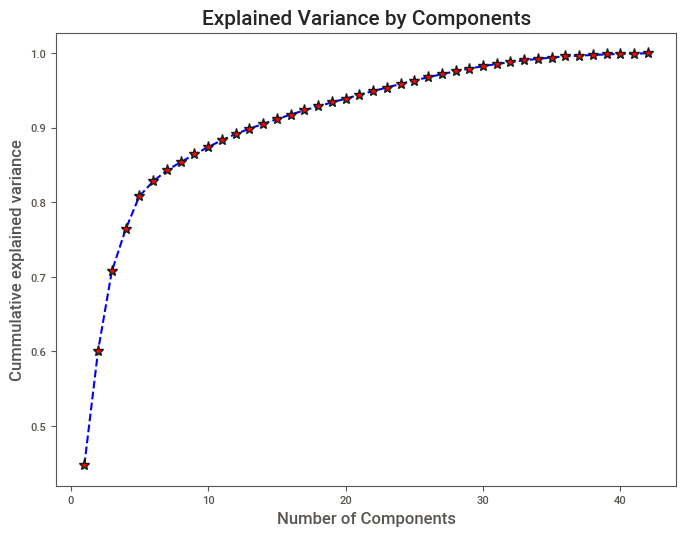

In [59]:
components = []
for i in range(1,fifa20_cluster_df.shape[1]+1):
    components.append(i)
plt.rcParams["figure.figsize"] =(8,6)
plt.plot(components,pca.explained_variance_ratio_.cumsum(),marker = "*", linestyle = "--", c='blue', mfc='red', mec='k',markersize = 8)
plt.title("Explained Variance by Components", fontsize = 15)
plt.xlabel("Number of Components", fontsize = 12)
plt.ylabel("Cummulative explained variance", fontsize = 12)

A rule of thumb is to preserve around 80 % of the variance. So, in this instance, decided to keep 5 components.

In [60]:
# Dimensionality reduction using PCA
pca = PCA(n_components=5)
fifa20_cluster_pca = pd.DataFrame(pca.fit_transform(fifa20_cluster_df))
fifa20_cluster_pca.head()

,0,1,2,3,4
0,11.802740,-5.769020,2.883901,-0.748631,0.356666
1,10.860709,-3.823812,3.921408,1.620485,-3.015107
2,10.663892,-6.370105,1.449142,-1.048082,0.017398
3,-5.688211,-4.916661,7.210638,-2.026024,-3.076341
4,10.585862,-5.166034,1.477037,-1.112208,-0.261039


In [61]:
print("PCA with 5 components captures {:.2f}% of the variance".format(pca.explained_variance_ratio_.sum()*100))

PCA with 5 components captures 80.83% of the variance


### <span style="color:darkblue">Model Creation <a id="8"></a></span>

#### <span style="color:darkblue">KMeans Clustering <a id="8.1"></a></span>
###### [back](#home)

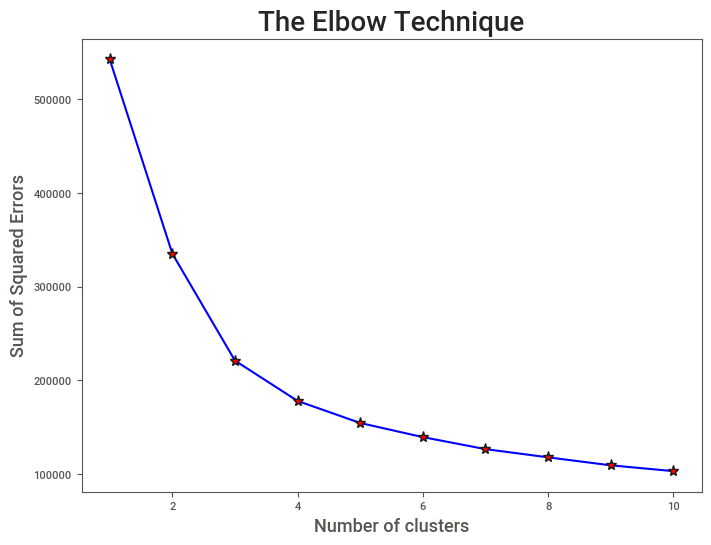

In [62]:
# Using elbow technique to find the optimum k value
kmeans = KMeans() # Object creation
# Creating empty list to store the values of Sum of Squared errors
SSE = [] 

plt.rcParams["figure.figsize"] =(8,6)
for i in range(1,11):
    kmeans = KMeans(n_clusters=i,random_state=42)
    kmeans = kmeans.fit(fifa20_cluster_pca)
    SSE.append(kmeans.inertia_)
plt.plot(range(1,11),SSE,marker = "*", linestyle = "-", c='blue', mfc='red', mec='k',markersize = 8)
plt.title('The Elbow Technique',fontsize=20)
plt.xlabel('Number of clusters',fontsize=13)
plt.ylabel('Sum of Squared Errors',fontsize=13)
plt.show()

In [63]:
# Using Elbow technique, we are initializing total number of cluster as 3
kmeans = KMeans(n_clusters=3,random_state=42)
kmeans.fit(fifa20_cluster_pca)
# Adding the cluster information to the fifa20_dataset
fifa20_dataset['cluster_kmeans'] = pd.DataFrame(kmeans.labels_)
fifa20_dataset.shape

(18278, 111)

In [64]:
# Total number of records in each cluster
fifa20_dataset['cluster_kmeans'].value_counts()

0    8857
2    7385
1    2036
Name: cluster_kmeans, dtype: int64

In [65]:
fifa20_dataset[['short_name','overall','player_positions','skill_dribbling','defending_marking','goalkeeping_handling','cluster_kmeans']].groupby(['cluster_kmeans']).head()

,short_name,overall,player_positions,skill_dribbling,defending_marking,goalkeeping_handling,cluster_kmeans
0,L. Messi,94,"RW, CF, ST",97,33,11,0
1,Cristiano Ronaldo,93,"ST, LW",89,28,11,0
2,Neymar Jr,92,"LW, CAM",96,27,9,0
3,J. Oblak,91,GK,12,27,92,1
4,E. Hazard,91,"LW, CF",95,34,12,0
5,K. De Bruyne,91,"CAM, CM",86,68,13,0
6,M. ter Stegen,90,GK,21,25,85,1
11,K. Koulibaly,89,CB,69,91,11,2
13,Alisson,89,GK,27,15,84,1
14,De Gea,89,GK,18,25,84,1


* cluster 0 - Players with high attacking / midfieldings skills, when compared to other skills.
* cluster 1 - Players with high goal keeping skills, when compared to other skills.
* cluster 2 - Players with high defending skills, when compared to other skills

In [66]:
# Model Evaluation
silhou_score = silhouette_score(fifa20_cluster_pca,kmeans.labels_)
print("Silhouette Score:",silhou_score)

Silhouette Score: 0.3433607530922451


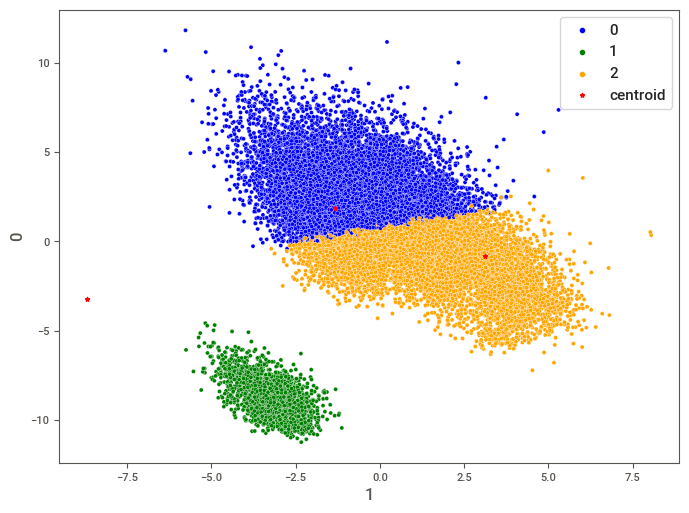

In [67]:
# Plotting the clusters which were formed using KMeans clustering
plt.rcParams["figure.figsize"] =(8,6)
palette = {
    0 : 'blue',
    1 : 'green',
    2 : 'orange',
}
sns.scatterplot(x=fifa20_cluster_pca[1],y=fifa20_cluster_pca[0],hue=fifa20_dataset.cluster_kmeans,palette = palette)
plt.scatter(kmeans.cluster_centers_[:,0],kmeans.cluster_centers_[:,1],color='red',marker='*',label='centroid')
plt.legend()

#### <span style="color:darkblue"> Density-Based Spatial Clustering <a id="8.2"></a></span>
###### [back](#home)

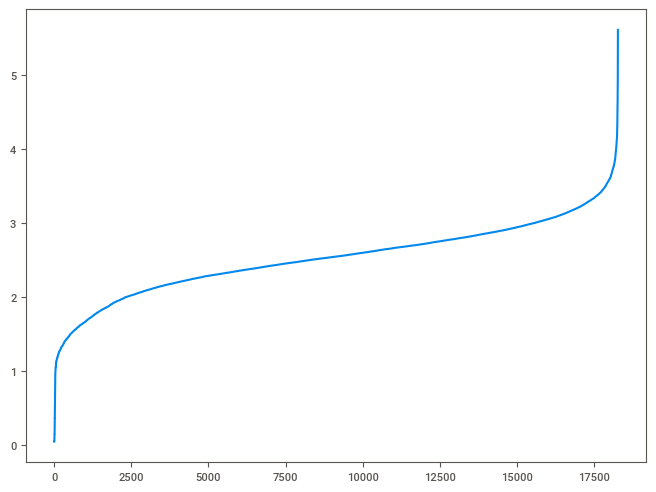

In [68]:
# Deciding Optimum value of Epsilon using Nearest Neighbour algorithm
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(fifa20_cluster_df)
distances, indices = nbrs.kneighbors(fifa20_cluster_df)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [69]:
# Model creation
db = DBSCAN(eps=4.8, min_samples=100)
db.fit(fifa20_cluster_pca)
# Adding the cluster information to the fifa20_dataset
fifa20_dataset['cluster_db'] = pd.DataFrame(db.labels_)
fifa20_dataset.shape

(18278, 112)

In [70]:
# Total number of records in each cluster
fifa20_dataset['cluster_db'].value_counts()

1    16242
0     2036
Name: cluster_db, dtype: int64

In [71]:
fifa20_dataset[['short_name','overall','player_positions','skill_dribbling','defending_marking','goalkeeping_handling','cluster_db']].groupby(['cluster_db']).head()

,short_name,overall,player_positions,skill_dribbling,defending_marking,goalkeeping_handling,cluster_db
0,L. Messi,94,"RW, CF, ST",97,33,11,1
1,Cristiano Ronaldo,93,"ST, LW",89,28,11,1
2,Neymar Jr,92,"LW, CAM",96,27,9,1
3,J. Oblak,91,GK,12,27,92,0
4,E. Hazard,91,"LW, CF",95,34,12,1
5,K. De Bruyne,91,"CAM, CM",86,68,13,1
6,M. ter Stegen,90,GK,21,25,85,0
13,Alisson,89,GK,27,15,84,0
14,De Gea,89,GK,18,25,84,0
25,Ederson,88,GK,23,29,82,0


* cluster 0 - Goal Keepers 
* cluster 1 - Non Goal Keepers

In [72]:
# Model Evaluation
silhou_score = silhouette_score(fifa20_cluster_pca,db.labels_)
print("Silhouette Score:",silhou_score)

Silhouette Score: 0.5204172004117267


<AxesSubplot:xlabel='1', ylabel='0'>

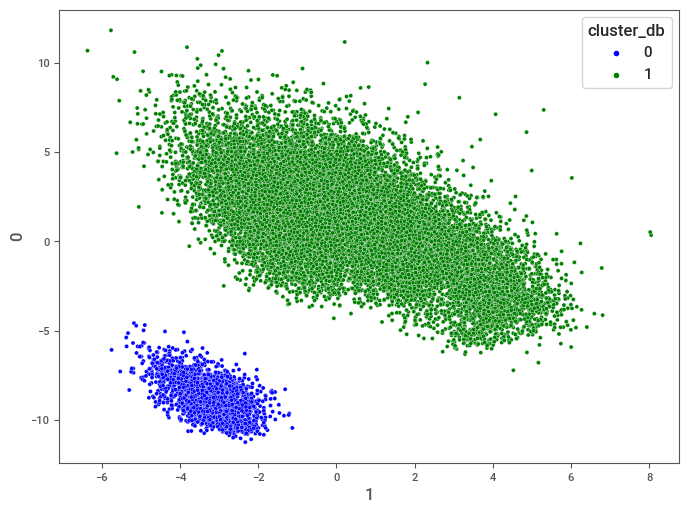

In [73]:
#visualize the clusters with respect to the first two components
plt.rcParams["figure.figsize"] =(8,6)
palette = {
    0 : 'blue',
    1 : 'green',
}
sns.scatterplot(x=fifa20_cluster_pca[1],y=fifa20_cluster_pca[0],hue=fifa20_dataset.cluster_db,palette = palette)

DB Scan Clustering is not suitable for this dataset

#### <span style="color:darkblue">Aggglomerative Hierarchial Clustering <a id="8.3"></a> </span>
###### [back](#home)

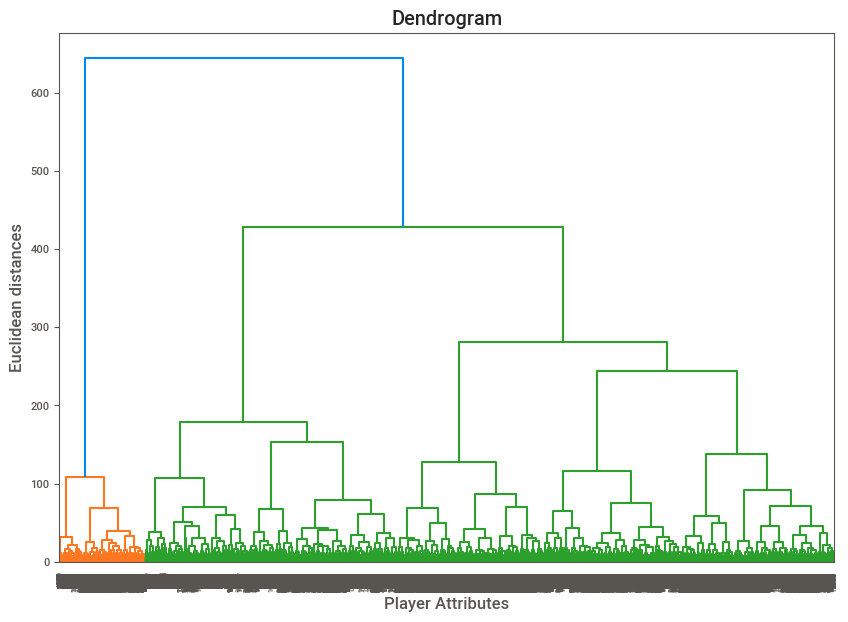

In [74]:
# Plotting dendogram with player attributes and Euclidian distance
plt.figure(figsize=(10, 7))
dendrogram = sch.dendrogram(sch.linkage(fifa20_cluster_df, method  = "ward"))
plt.title('Dendrogram')
plt.xlabel('Player Attributes')
plt.ylabel('Euclidean distances')
plt.show()

In [75]:
# Model creation and adding the cluster information to the fifa_dataset
hierarchial = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')  
fifa20_dataset['cluster_hierarchial'] = hierarchial.fit_predict(fifa20_cluster_df)

In [76]:
# Total number of records in each cluster
fifa20_dataset['cluster_hierarchial'].value_counts()

0    10296
2     5946
1     2036
Name: cluster_hierarchial, dtype: int64

In [77]:
fifa20_dataset[['short_name','overall','player_positions','skill_dribbling','defending_marking','goalkeeping_handling','cluster_hierarchial']].groupby(['cluster_hierarchial']).head()

,short_name,overall,player_positions,skill_dribbling,defending_marking,goalkeeping_handling,cluster_hierarchial
0,L. Messi,94,"RW, CF, ST",97,33,11,2
1,Cristiano Ronaldo,93,"ST, LW",89,28,11,2
2,Neymar Jr,92,"LW, CAM",96,27,9,2
3,J. Oblak,91,GK,12,27,92,1
4,E. Hazard,91,"LW, CF",95,34,12,2
5,K. De Bruyne,91,"CAM, CM",86,68,13,2
6,M. ter Stegen,90,GK,21,25,85,1
11,K. Koulibaly,89,CB,69,91,11,0
13,Alisson,89,GK,27,15,84,1
14,De Gea,89,GK,18,25,84,1


* cluster 0 - Players with high defending skills, when compared to other skills
* cluster 1 - Players with high goal keeping skills, when compared to other skills.
* cluster 2 - Players with high attacking / midfieldings skills, when compared to other skills.

In [78]:
# Model Evaluation
silhou_score = silhouette_score(fifa20_cluster_pca,hierarchial.labels_)
print("Silhouette Score:",silhou_score)

Silhouette Score: 0.28797676897269026


<AxesSubplot:xlabel='1', ylabel='0'>

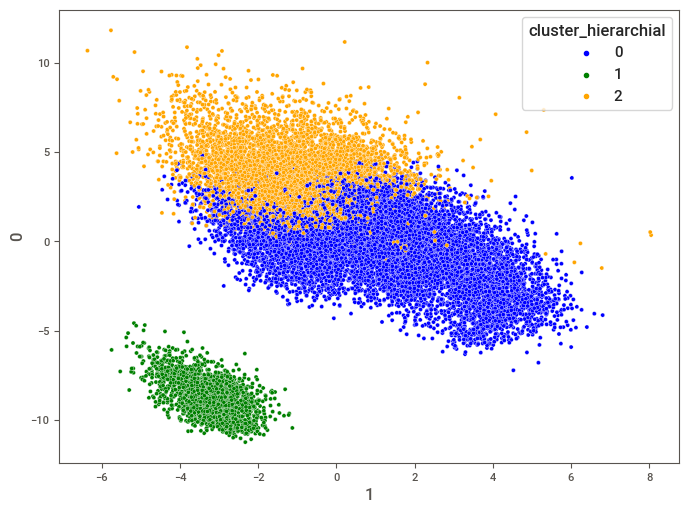

In [79]:
#visualize the clusters with respect to the first two components
plt.rcParams["figure.figsize"] =(8,6)
palette = {
    0 : 'blue',
    1 : 'green',
    2 : 'orange',
}

sns.scatterplot(x=fifa20_cluster_pca[1],y=fifa20_cluster_pca[0],hue=fifa20_dataset.cluster_hierarchial,palette = palette)

Agglomerative clustering was implemented using multiple linkage values (‘ward’, ‘complete’, ‘average’, ‘single’), but ward provided better clustering with silhouette score 0.28 but not better than Kmeans clustering

### <span style="color:darkblue">Conclusion <a id="9"></a>
###### [back](#home)

###### KMeans clustering is the better model with highest silhouette score 0.34 with 3 clusters.

Note : Silhouette score increased when tried reducing the total number of records in the dataset

In [80]:
fifa20_dataset[['short_name','overall','player_positions','skill_dribbling','defending_marking','goalkeeping_handling','cluster_kmeans']].groupby(['cluster_kmeans']).head()

,short_name,overall,player_positions,skill_dribbling,defending_marking,goalkeeping_handling,cluster_kmeans
0,L. Messi,94,"RW, CF, ST",97,33,11,0
1,Cristiano Ronaldo,93,"ST, LW",89,28,11,0
2,Neymar Jr,92,"LW, CAM",96,27,9,0
3,J. Oblak,91,GK,12,27,92,1
4,E. Hazard,91,"LW, CF",95,34,12,0
5,K. De Bruyne,91,"CAM, CM",86,68,13,0
6,M. ter Stegen,90,GK,21,25,85,1
11,K. Koulibaly,89,CB,69,91,11,2
13,Alisson,89,GK,27,15,84,1
14,De Gea,89,GK,18,25,84,1


* cluster 0 - Players with high attacking / midfieldings skills, when compared to other skills.
* cluster 1 - Players with high goal keeping skills, when compared to other skills.
* cluster 2 - Players with high defending skills, when compared to other skills

### <span style="color:darkblue">Challenges faced <a id="10"></a></span>
###### [back](#home)

* To explore tableau, Bivariate analysis and Multivariate analysis were performed using Tableau public.
* Handling Missing Values 
	* Instead of updating values manually or by using mean or median, combined data of goalkeepers ['gk_diving', 'gk_handling', 'gk_kicking', 'gk_reflexes', 'gk_speed', 'gk_positioning'] and non goalkeepers['pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic'] and created new features 'PAC / DIV'(pace+gk_diving),'SHO / HAN'(shooting+gk_handling),'PAS / KIC'(passing/gk_kicking),'DRI / REF'(dribbling+gk_reflexing),'DEF / SPD'(defending+gk_speed), 'PHY / POS'(physic+gk_positioning). New column names based on the filters provided in the sofifa website(https://sofifa.com/players)
	* Other missing columns have either more than 50% of missing values or does not belong to player attributes.
* Removing the unwanted features - 
    * Excluded the features which are not player attributes.There was no information on this in SOFIFA website 
    * Overall and Potential attribute is used only in preprocessing and discussion stages because
    using it in modelling could lead to domination by this feature.
* Handling features having multiple values - As work_rate column was having multiple values splitted the column into attack_rate and defence_rate.
* Handling categorical features - Encoded non-numerical categorical features using One Hot encoding technique(pandas.get_dummies).
* Handling outliers 
	* Detected Outliers using IQR method and also checked for skewness and kurtosis as we are not using boxplots or distplots to check outliers and distribution.
	* Reduced the skewness from the positively skewed data using Log transformation.
	* Reduced the skewness from the negatively skewed data using Squares transformation.
* Feature selection using correlation
	* As there are too many features, checked the correlation by creating a new dataframe with values of correlation and checked only highly correlated features
	* Dropped few highly correlated columns from the dataset.['movement_acceleration','skill_ball_control', 'defending_sliding_tackle', 'mentality_interceptions','defending_standing_tackle']
* Scaled the numerical continuos features using Standard scalar.
* A rule of thumb is to preserve around 80 % of the variance. For this dataset, decided to keep 5 components, which captures 80.83% of the variance.
* DB Scan Clustering is not suitable for this dataset, only 2 clusters were formed
* Kmeans clustering was better model with highest silhouette score when compared to Agglomerative Hierarchial clustering.